In [9]:
import pandas as pd
import numpy as np
import json
from collections import defaultdict

import networkx as nx
import matplotlib.pyplot as plt
%matplotlib inline

from fa2 import ForceAtlas2
import community

import os
import sys
import copy

import re
import nltk
from nltk.corpus import stopwords
import progressbar

from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import community

from PIL import Image
import random

# Function definitions

In [14]:
# Function to calculate TF-IDF
def TFIDF(dataframes):
    dataframes_tfidf = []
    all_words = []
    
    #Caclulate TF
    for i in range(len(dataframes)):
        df = dataframes[i]
        df_tfidf = df.groupby("word").size()
        df_words = df_tfidf.index
        df_counts = df_tfidf.values
        
        df_tfidf = pd.DataFrame(data=dict(word=df_words, TF=df_counts))
        df_tfidf.sort_values(by="TF", ascending=False)
        df_tfidf.reset_index(inplace=True)
        dataframes_tfidf.append(df_tfidf)
        
        all_words.extend(df_words)
    
    df_all = pd.DataFrame(data=dict(word=all_words))
    df_all = df_all.groupby("word").size()
    df_all_words = df_all.index
    df_all_counts = df_all.values
    df_all = pd.DataFrame(data=dict(word=df_all_words,
                                    count=df_all_counts))
    #Calculate IDF
    N = len(dataframes)
    for i in range(len(dataframes_tfidf)):
        df = dataframes_tfidf[i]
        df_merged = pd.merge(df, df_all, on="word")
        df_merged["IDF"] = N/(1+np.log(df_merged["count"]))
        df_merged["TFIDF"] = df_merged["TF"] * df_merged["IDF"]
        df_merged.sort_values(by="TFIDF", ascending=False)
        dataframes_tfidf[i] = df_merged
    
    return dataframes_tfidf



In [15]:
# Download the list of word sentiments
word_sentiments = pd.read_csv("../data/sentiment.csv")[["word", "happiness_rank", "happiness_average", "happiness_standard_deviation"]]

# A function that calculates the sentiment of a list of tokens
def evaluate_sentiment(tokens):
    # Convert tokens list to dataframe
    df = pd.DataFrame(data=dict(word=tokens))
    # Count how many times each word is mentioned
    df2 = df.groupby("word").size()
    words = df2.index.values
    # Convert counts to frequency
    freq = df2.values / float(len(tokens))
    
    # DataFrame with word frequencies
    df_final = pd.DataFrame(data=dict(word=words, freqs=freq))
    
    # Calculate the sentiment using word frequency and word happiness
    df_final = df_final.merge(word_sentiments, on="word")
    df_final["havg"] = df_final["happiness_average"]*df_final["freqs"]
    
    return sum(df_final["havg"])

# Network creation

In [23]:
with open("Data/starwars_vader_split.json") as f:
    starwars_json = json.load(f)

In [3]:
with open("Data/starwars_with_sentiment.json") as f:
    starwars_json = json.load(f)
    
movies = ["Star Wars: Episode I The Phantom Menice", "Star Wars: Episode II Attack of the Clones",
        "Star Wars: The Clone Wars (film)", "Star Wars: Episode III Revenge of the Sith",
        "Solo: A Star Wars Story", "Rogue One: A Star Wars Story", "Star Wars: Episode IV A New Hope",
        "Star Wars: Episode V The Empire Strikes Back", "Star Wars: Episode VI Return of the Jedi",
        "Star Wars: Episode VII The Force Awakens", "Star Wars: Episode VIII The Last Jedi"]

animated_series_names = ["Star Wars: The Clone Wars (series)", "Star Wars Rebels"]

original_trilogy = movies[6:9]

use = original_trilogy


use = [movies[6]]#("series", animated_series_names[0])]


In [4]:
digraphs = defaultdict(dict)
all_media = movies
all_media.extend(animated_series_names)

# Create graphs for each film
exclude_from_nodes = set(["canon", "hologram", "ABC Television Network"])
nodes = []
for m in all_media:
    DG = nx.DiGraph()
    nodes = list(set(starwars_json["data"]["characters"].keys()).difference(set(starwars_json["failed"]["characters"].keys()).union(exclude_from_nodes)))
    for n in nodes:
    #     if n == "Darth Vader":
    #         print starwars_json["data"]["characters"][n]
        movie = [x for x in starwars_json["data"]["movies"].keys() if n in starwars_json["data"]["movies"][x]["characters"]]
        series = defaultdict(list)
        for s in starwars_json["data"]["series"].keys():
            for e in starwars_json["data"]["series"][s]:
                if n in starwars_json["data"]["series"][s][e]["characters"]:
                    series[s].append(e)
        attribute = {"affiliations": starwars_json["data"]["characters"][n]["affiliations"],
                    "sentiment": starwars_json["data"]["characters"][n]["analysis"]["sentiment"]}
        if (m in movie) or (m in series):
            DG.add_node(n, data=attribute)

    # Create links between nodes
    for n in DG.nodes():
        links = list(set(starwars_json["data"]["characters"][n]["connections"]).difference(
            set(starwars_json["failed"]["characters"].keys()).union(exclude_from_nodes)).intersection(DG.nodes()))
        if len(links) > 0:
            for l in links:
                DG.add_edge(n, l)
    digraphs[m]["graph"] = DG

    
#Create graph of the entire joint universe
DG = nx.DiGraph()
nodes = list(set(starwars_json["data"]["characters"].keys()).difference(set(starwars_json["failed"]["characters"].keys()).union(exclude_from_nodes)))
for n in nodes:
#     if n == "Darth Vader":
#         print starwars_json["data"]["characters"][n]
    movie = [x for x in starwars_json["data"]["movies"].keys() if n in starwars_json["data"]["movies"][x]["characters"]]
    series = defaultdict(list)
    for s in starwars_json["data"]["series"].keys():
        for e in starwars_json["data"]["series"][s]:
            if n in starwars_json["data"]["series"][s][e]["characters"]:
                series[s].append(e)
    attribute = {"affiliations": starwars_json["data"]["characters"][n]["affiliations"]}
    DG.add_node(n, data=attribute)

# Create links between nodes
for n in DG.nodes():
    links = list(set(starwars_json["data"]["characters"][n]["connections"]).difference(
        set(starwars_json["failed"]["characters"].keys()).union(exclude_from_nodes)))
    if len(links) > 0:
        for l in links:
            DG.add_edge(n, l)
digraphs["all"]["graph"] = DG

In [5]:
for dig in digraphs.keys():
    print
    print dig
    DG = digraphs[dig]["graph"]
    # Setup for the force atlas algorithm.
    forceatlas2 = ForceAtlas2(
                              # Behavior alternatives
                              outboundAttractionDistribution=False,  # Dissuade hubs
                              linLogMode=False,  # NOT IMPLEMENTED
                              adjustSizes=False,  # Prevent overlap (NOT IMPLEMENTED)
                              edgeWeightInfluence=1.0,

                              # Performance
                              jitterTolerance=0.01,  # Tolerance
                              barnesHutOptimize=True,
                              barnesHutTheta=0.12,
                              multiThreaded=False,  # NOT IMPLEMENTED

                              # Tuning
                              scalingRatio=0.02,
                              strongGravityMode=False,
                              gravity=1.0,

                              # Log
                              verbose=True)

    # Create an undirected version of the graph
    G = DG.to_undirected()

    # Calculate node positions with the force atlas algorithm using the undirected graph
    positions = forceatlas2.forceatlas2_networkx_layout(G, pos=None, iterations=20000)
    pos_for_json = {}
    for x in positions:
        pos_for_json[x] = list(positions[x])
    digraphs[dig]["node_pos"] = pos_for_json
    
dgraphs = copy.deepcopy(digraphs)
for dig in dgraphs.keys():
    dgraphs[dig]["graph"] = nx.readwrite.json_graph.node_link_data(DG)

with open(os.path.join("Data", "movie_networks.json"), 'w') as f:
    json.dump(dgraphs, f)


Star Wars: Episode II Attack of the Clones


100%|███████████████████████████████████████████████████████████████████████████| 20000/20000 [00:59<00:00, 336.60it/s]


('BarnesHut Approximation', ' took ', '4.27', ' seconds')
('Repulsion forces', ' took ', '50.65', ' seconds')
('Gravitational forces', ' took ', '0.24', ' seconds')
('Attraction forces', ' took ', '0.24', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.86', ' seconds')

Star Wars: Episode VI Return of the Jedi


100%|███████████████████████████████████████████████████████████████████████████| 20000/20000 [00:50<00:00, 396.93it/s]


('BarnesHut Approximation', ' took ', '3.87', ' seconds')
('Repulsion forces', ' took ', '42.77', ' seconds')
('Gravitational forces', ' took ', '0.16', ' seconds')
('Attraction forces', ' took ', '0.19', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.76', ' seconds')

Star Wars: The Clone Wars (series)


100%|████████████████████████████████████████████████████████████████████████████| 20000/20000 [22:46<00:00, 14.42it/s]


('BarnesHut Approximation', ' took ', '41.20', ' seconds')
('Repulsion forces', ' took ', '1269.27', ' seconds')
('Gravitational forces', ' took ', '1.39', ' seconds')
('Attraction forces', ' took ', '1.60', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '4.44', ' seconds')

Star Wars: The Clone Wars (film)


100%|██████████████████████████████████████████████████████████████████████████| 20000/20000 [00:09<00:00, 2216.80it/s]


('BarnesHut Approximation', ' took ', '1.30', ' seconds')
('Repulsion forces', ' took ', '6.51', ' seconds')
('Gravitational forces', ' took ', '0.09', ' seconds')
('Attraction forces', ' took ', '0.11', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.33', ' seconds')

Solo: A Star Wars Story


100%|███████████████████████████████████████████████████████████████████████████| 20000/20000 [01:14<00:00, 270.04it/s]


('BarnesHut Approximation', ' took ', '4.93', ' seconds')
('Repulsion forces', ' took ', '63.78', ' seconds')
('Gravitational forces', ' took ', '0.26', ' seconds')
('Attraction forces', ' took ', '0.17', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.98', ' seconds')

Star Wars: Episode IV A New Hope


100%|███████████████████████████████████████████████████████████████████████████| 20000/20000 [01:18<00:00, 249.39it/s]


('BarnesHut Approximation', ' took ', '5.04', ' seconds')
('Repulsion forces', ' took ', '67.66', ' seconds')
('Gravitational forces', ' took ', '0.28', ' seconds')
('Attraction forces', ' took ', '0.24', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '1.00', ' seconds')

Rogue One: A Star Wars Story


100%|███████████████████████████████████████████████████████████████████████████| 20000/20000 [01:50<00:00, 180.50it/s]


('BarnesHut Approximation', ' took ', '9.20', ' seconds')
('Repulsion forces', ' took ', '93.90', ' seconds')
('Gravitational forces', ' took ', '0.36', ' seconds')
('Attraction forces', ' took ', '0.25', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '1.22', ' seconds')

Star Wars: Episode VIII The Last Jedi


100%|███████████████████████████████████████████████████████████████████████████| 20000/20000 [01:37<00:00, 205.29it/s]


('BarnesHut Approximation', ' took ', '7.76', ' seconds')
('Repulsion forces', ' took ', '82.44', ' seconds')
('Gravitational forces', ' took ', '0.32', ' seconds')
('Attraction forces', ' took ', '0.20', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '1.17', ' seconds')

Star Wars: Episode V The Empire Strikes Back


100%|██████████████████████████████████████████████████████████████████████████| 20000/20000 [00:15<00:00, 1268.31it/s]


('BarnesHut Approximation', ' took ', '1.98', ' seconds')
('Repulsion forces', ' took ', '12.14', ' seconds')
('Gravitational forces', ' took ', '0.10', ' seconds')
('Attraction forces', ' took ', '0.10', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.44', ' seconds')

all


100%|██████████████████████████████████████████████████████████████████████████| 20000/20000 [2:33:25<00:00,  2.21it/s]


('BarnesHut Approximation', ' took ', '191.31', ' seconds')
('Repulsion forces', ' took ', '8898.35', ' seconds')
('Gravitational forces', ' took ', '3.38', ' seconds')
('Attraction forces', ' took ', '3.19', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '12.57', ' seconds')

Star Wars: Episode III Revenge of the Sith


100%|███████████████████████████████████████████████████████████████████████████| 20000/20000 [01:09<00:00, 269.59it/s]


('BarnesHut Approximation', ' took ', '4.54', ' seconds')
('Repulsion forces', ' took ', '59.47', ' seconds')
('Gravitational forces', ' took ', '0.26', ' seconds')
('Attraction forces', ' took ', '0.29', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.93', ' seconds')

Star Wars Rebels


100%|████████████████████████████████████████████████████████████████████████████| 20000/20000 [03:56<00:00, 84.57it/s]


('BarnesHut Approximation', ' took ', '12.06', ' seconds')
('Repulsion forces', ' took ', '209.54', ' seconds')
('Gravitational forces', ' took ', '0.48', ' seconds')
('Attraction forces', ' took ', '0.79', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '1.86', ' seconds')

Star Wars: Episode I The Phantom Menice


100%|███████████████████████████████████████████████████████████████████████████| 20000/20000 [00:54<00:00, 364.28it/s]


('BarnesHut Approximation', ' took ', '4.21', ' seconds')
('Repulsion forces', ' took ', '46.32', ' seconds')
('Gravitational forces', ' took ', '0.24', ' seconds')
('Attraction forces', ' took ', '0.22', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '0.90', ' seconds')

Star Wars: Episode VII The Force Awakens


100%|███████████████████████████████████████████████████████████████████████████| 20000/20000 [01:41<00:00, 197.18it/s]


('BarnesHut Approximation', ' took ', '8.50', ' seconds')
('Repulsion forces', ' took ', '85.82', ' seconds')
('Gravitational forces', ' took ', '0.32', ' seconds')
('Attraction forces', ' took ', '0.26', ' seconds')
('AdjustSpeedAndApplyForces step', ' took ', '1.19', ' seconds')


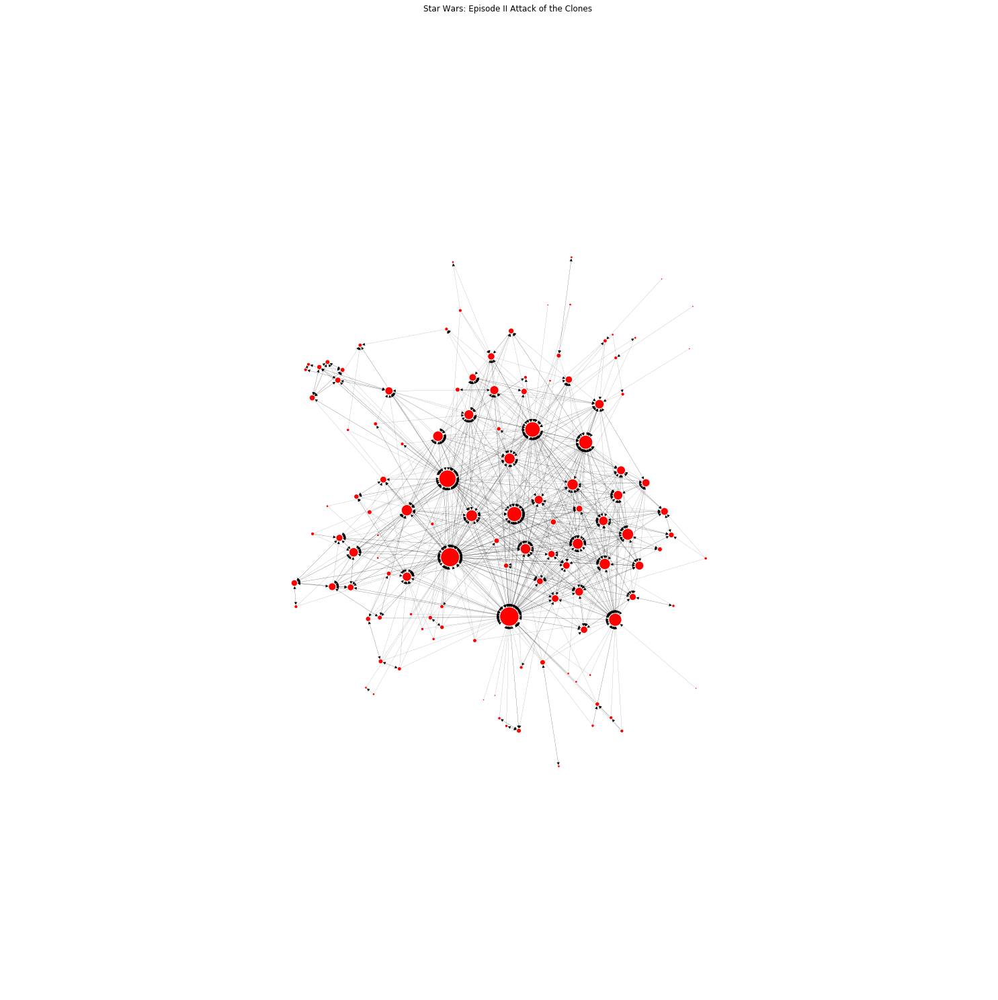

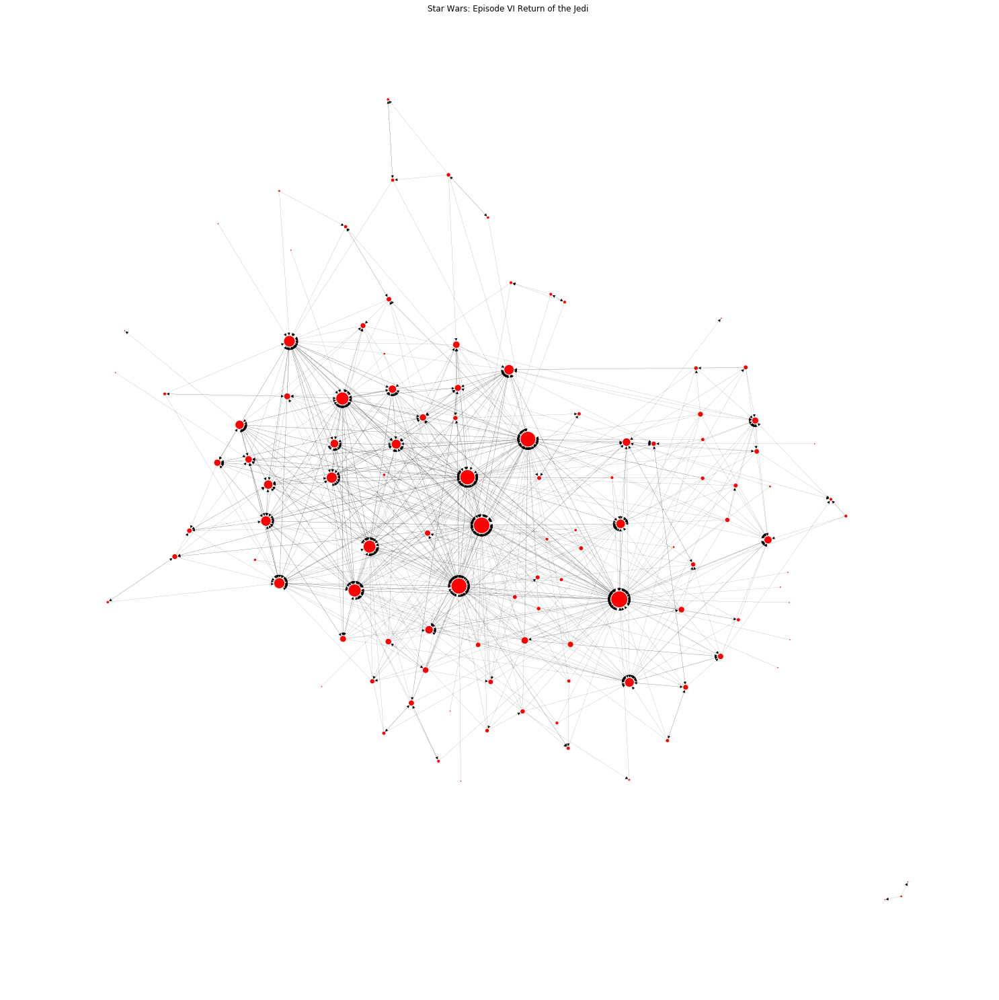

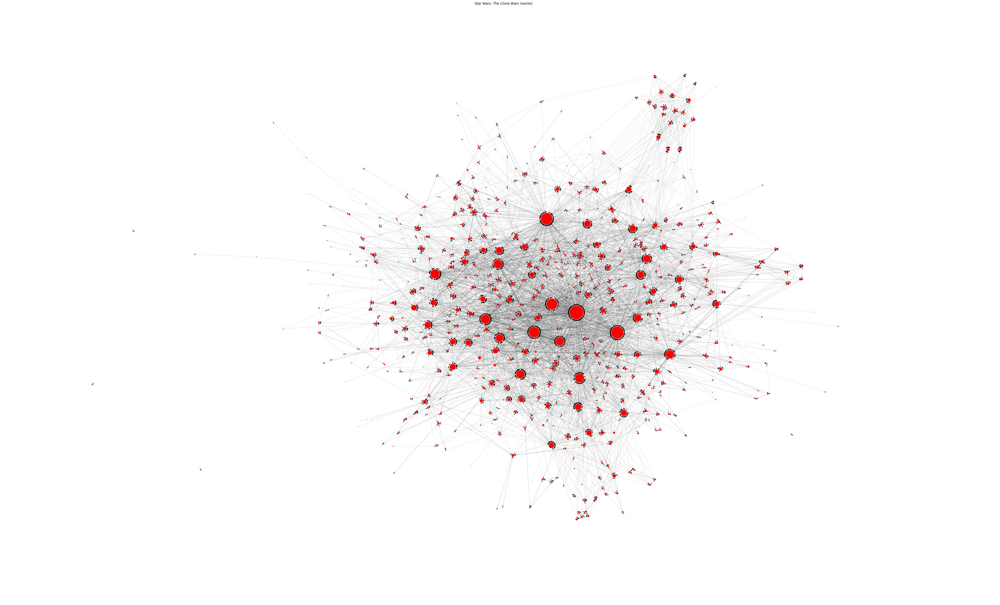

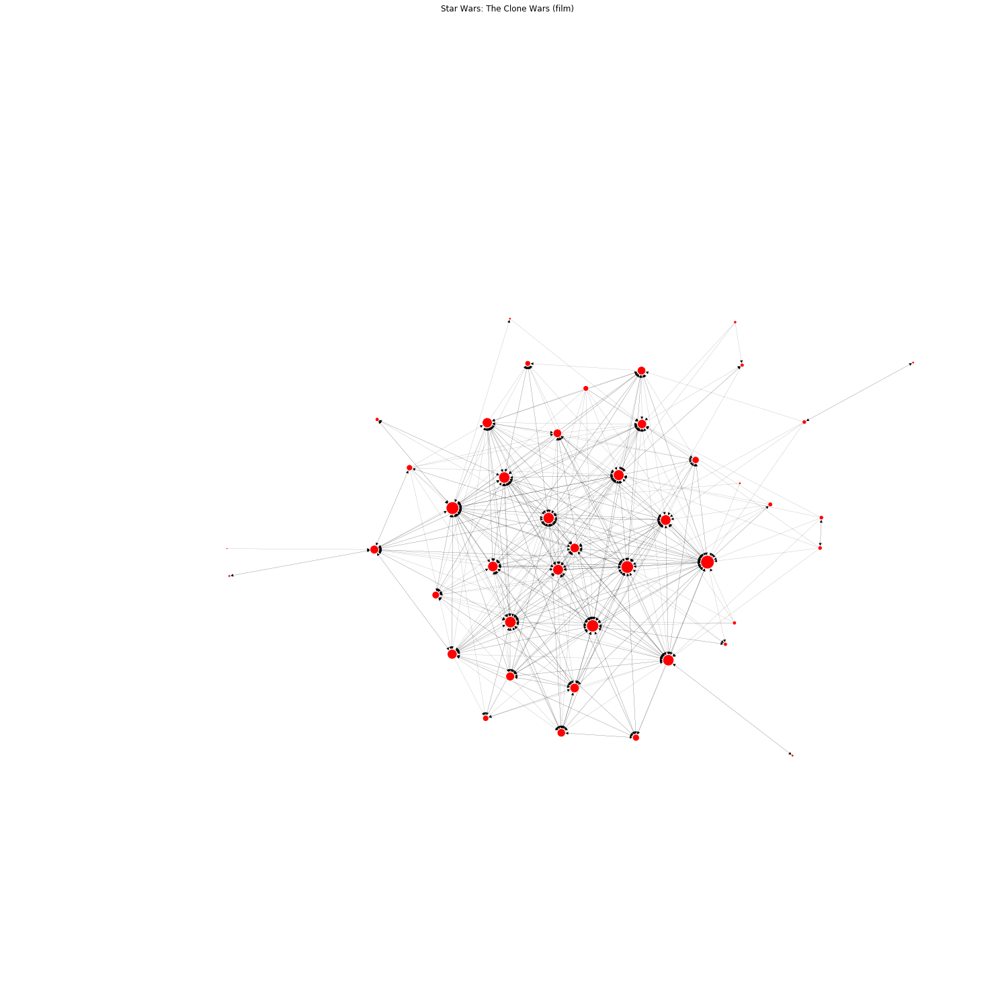

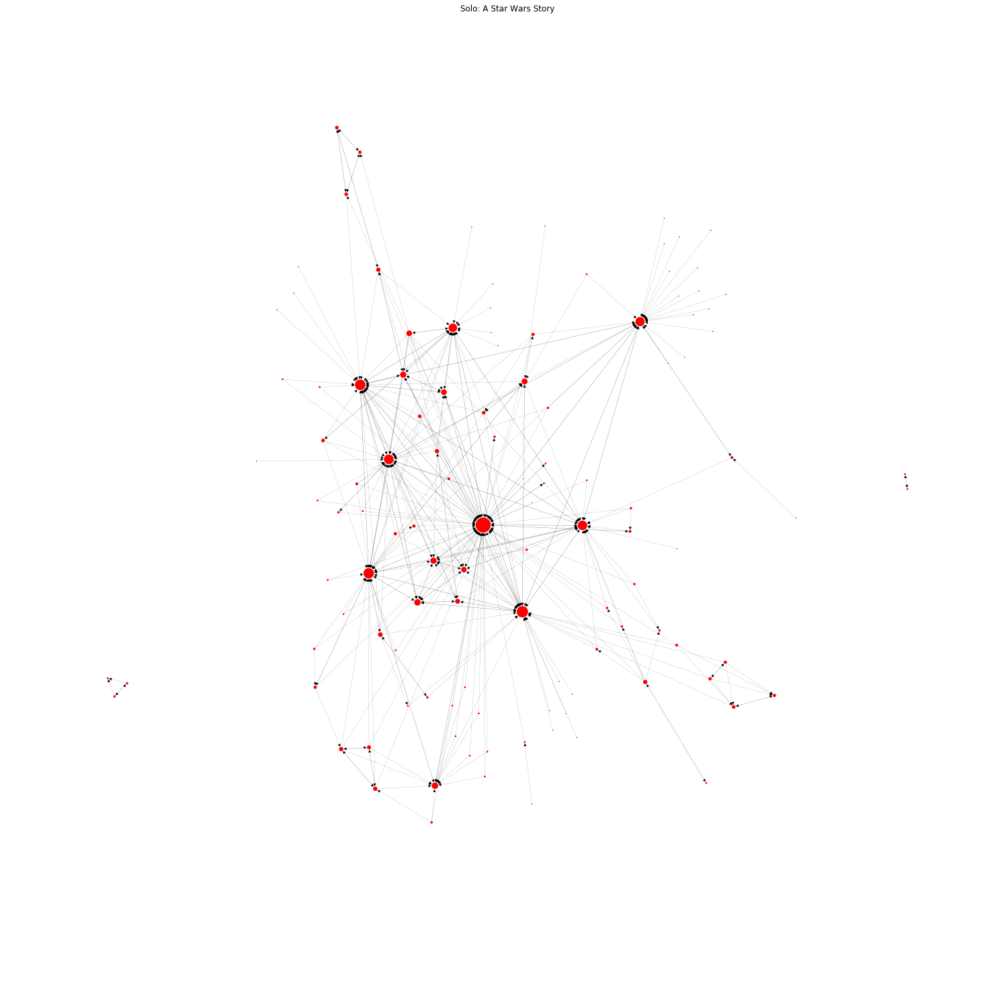

...

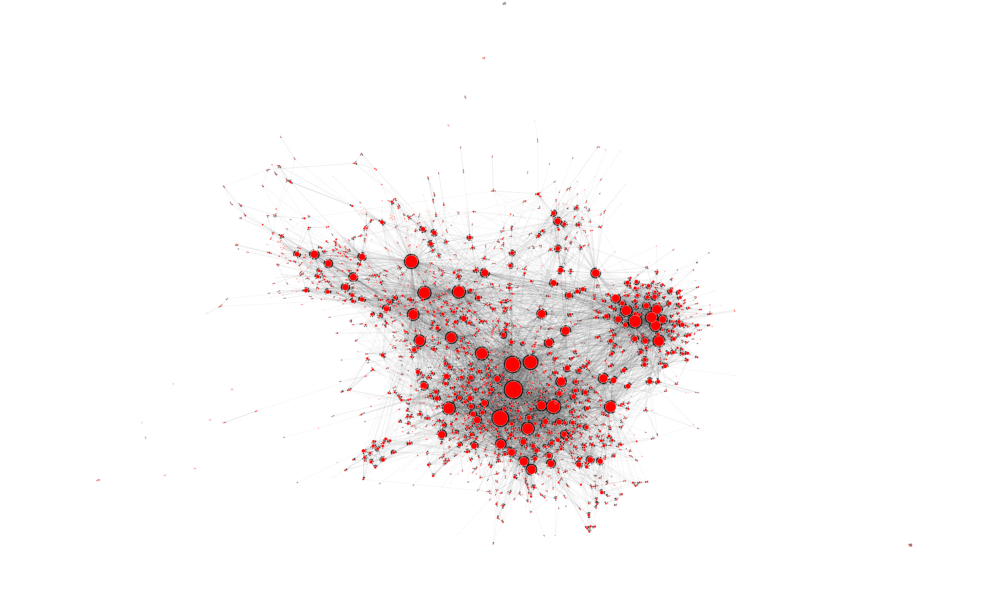

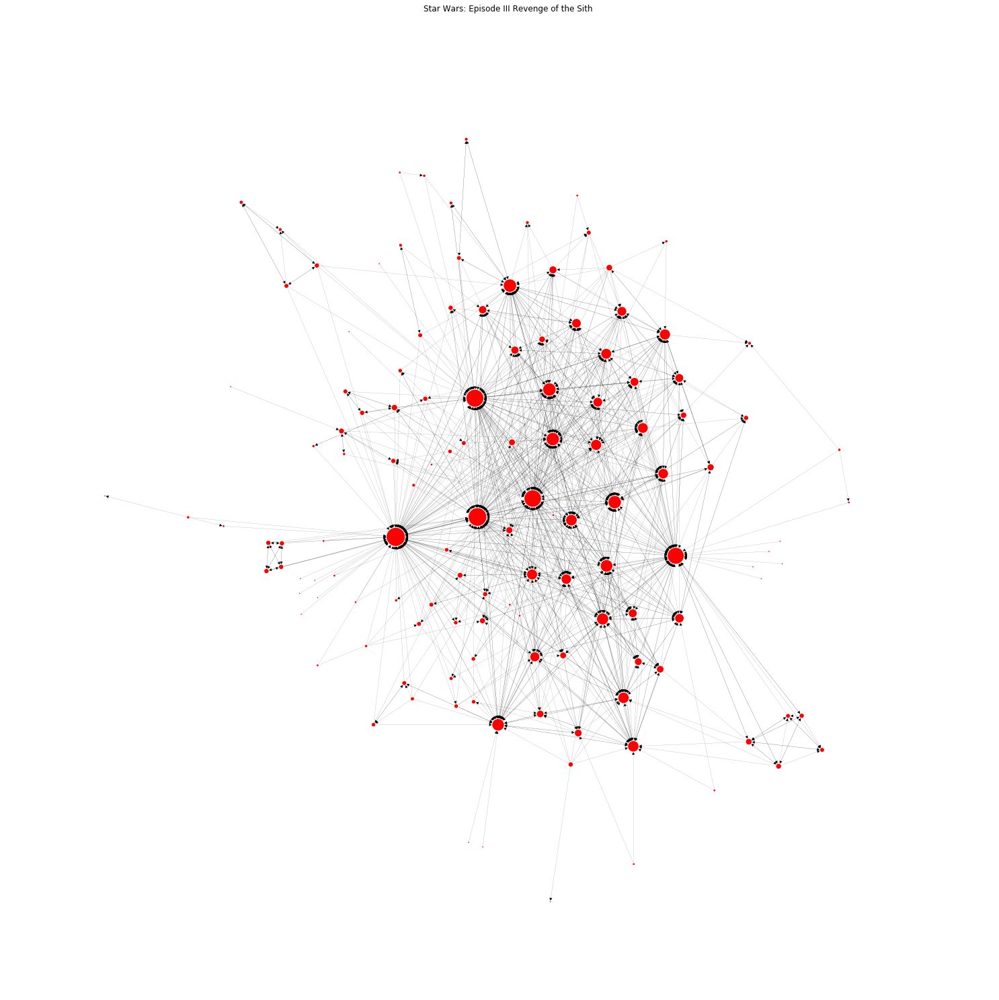

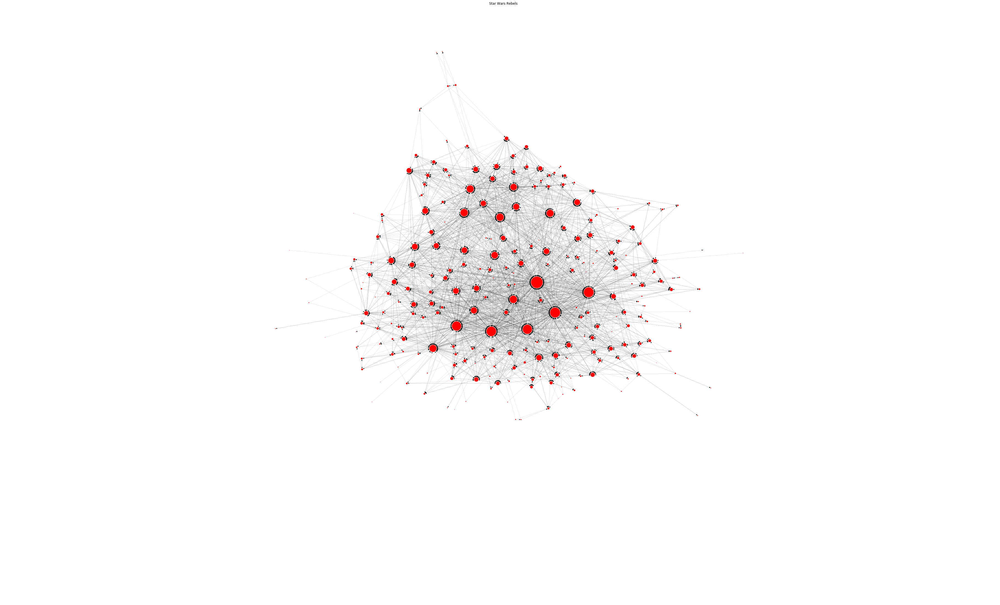

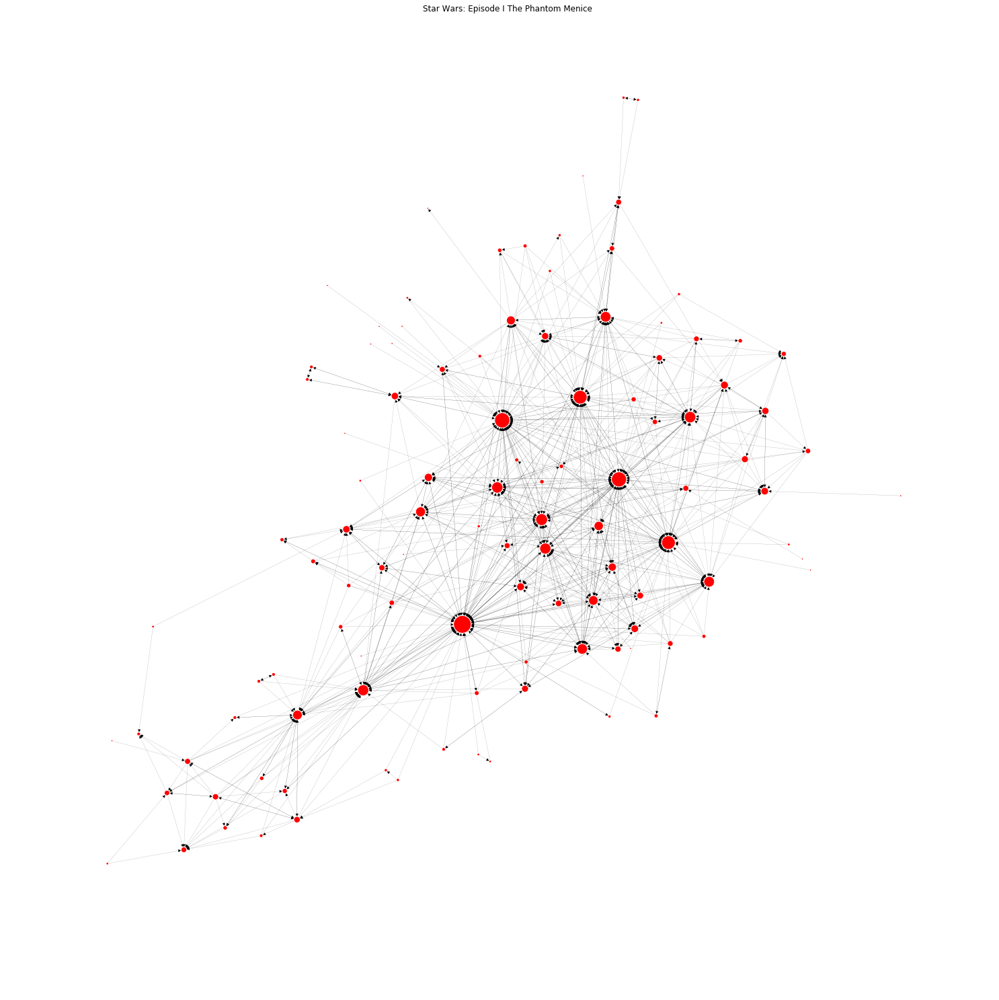

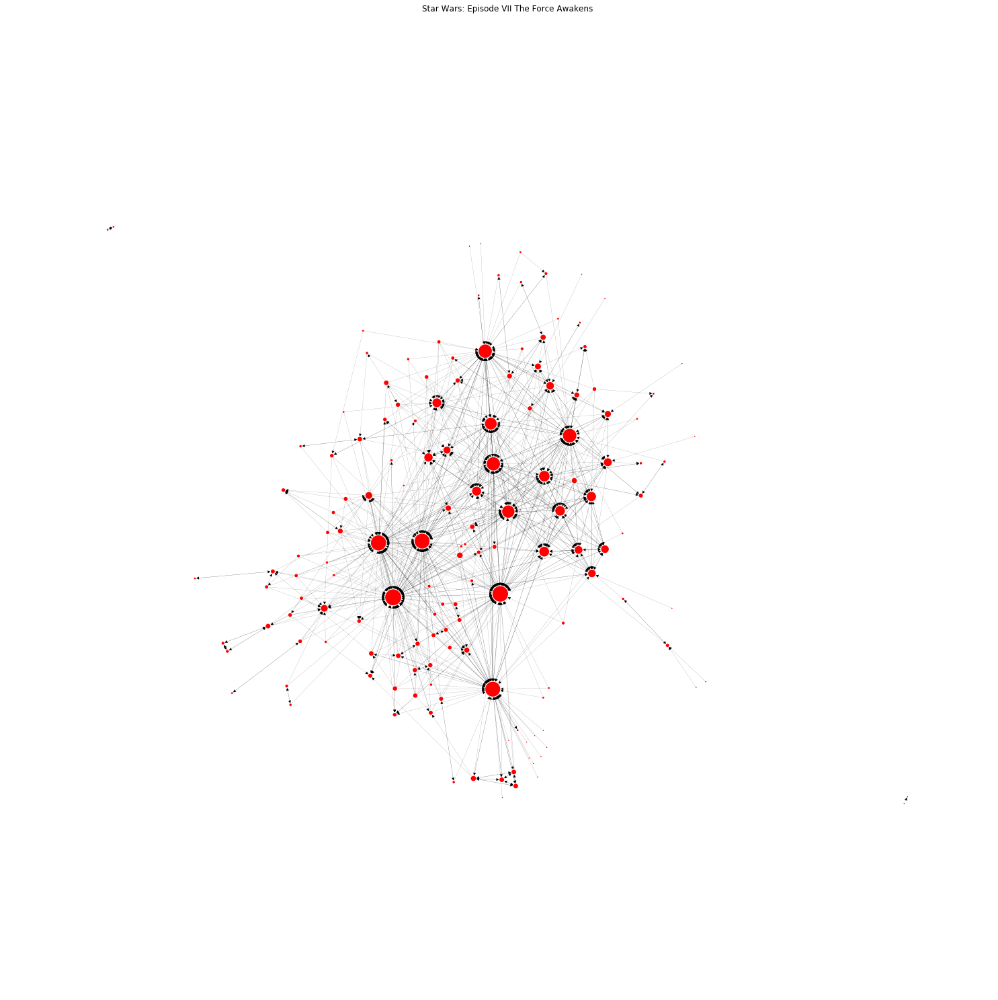

In [8]:
for dig in digraphs.keys():
    DG = digraphs[dig]["graph"]
    nodes = DG.nodes(data=True)
    nodes_2, degrees = zip(*DG.degree())

    # node size proportional to the degree
    node_sizes_deg = [7*x for x in degrees]

    # # Color according to the party
    # node_colors = ['r' if x[1]['party'] == "Republican" else "b" for x in nodes]
    # nx.draw(DG, positions, node_color=node_colors, node_size=node_sizes_deg, with_labels=False, edgecolors="white", edge_color='k', width=0.1)
    if dig in ("all","Star Wars: The Clone Wars (series)", "Star Wars Rebels") :
        plt.figure(figsize=(50,30))
    else:
        plt.figure(figsize=(20,20))
    nx.draw(DG, digraphs[dig]["node_pos"], node_color='red', node_size=node_sizes_deg, with_labels=False, edgecolors="white", edge_color='k', width=0.1)
    plt.title(dig)
    directory = os.path.join("Data", dig.replace(" ", "_").replace(":",""))
    if not os.path.exists(directory):
        os.makedirs(directory)
    plt.savefig(os.path.join(directory, "network.png"))

10 highest degree


name,degree
Obi-Wan Kenobi,116
Anakin Skywalker,112
Padmé Amidala,94
Darth Sidious,74
Mace Windu,70
Dooku,61
Yoda,53
Kit Fisto,43
R2-D2,42
Ki-Adi-Mundi,39


10 highest degree centrality


name,degree_centrality
Obi-Wan Kenobi,0.865672
Anakin Skywalker,0.835821
Padmé Amidala,0.701493
Darth Sidious,0.552239
Mace Windu,0.522388
Dooku,0.455224
Yoda,0.395522
Kit Fisto,0.320896
R2-D2,0.313433
Plo Koon,0.291045


10 highest eigenvector centrality


name,eigenvector_centrality
Obi-Wan Kenobi,0.307808
Anakin Skywalker,0.298269
Padmé Amidala,0.271760
Darth Sidious,0.271590
Dooku,0.261823
Mace Windu,0.246420
Yoda,0.223280
Qui-Gon Jinn,0.212090
Jango Fett,0.195513
Sifo-Dyas,0.164412


10 highest degree


name,degree
Jabba Desilijic Tiure,89
Han Solo,84
Luke Skywalker,79
Chewbacca,76
Leia Organa,72
Darth Vader,53
C-3PO,53
R2-D2,51
Darth Sidious,42
Lando Calrissian,38


10 highest degree centrality


name,degree_centrality
Jabba Desilijic Tiure,0.729508
Han Solo,0.688525
Luke Skywalker,0.647541
Chewbacca,0.622951
Leia Organa,0.590164
Darth Vader,0.434426
C-3PO,0.434426
R2-D2,0.418033
Darth Sidious,0.344262
Lando Calrissian,0.311475


10 highest eigenvector centrality


name,eigenvector_centrality
Luke Skywalker,0.275434
Leia Organa,0.274930
Darth Vader,0.272776
Han Solo,0.272000
Chewbacca,0.266959
Darth Sidious,0.257195
Jabba Desilijic Tiure,0.254545
R2-D2,0.238532
C-3PO,0.226635
Anakin Skywalker,0.222431


10 highest degree


name,degree
Anakin Skywalker,380
Obi-Wan Kenobi,301
Ahsoka Tano,269
Darth Vader,239
Dooku,225
Darth Sidious,174
Padmé Amidala,174
Rex,166
Asajj Ventress,145
R2-D2,145


10 highest degree centrality


name,degree_centrality
Anakin Skywalker,0.568862
Obi-Wan Kenobi,0.450599
Ahsoka Tano,0.402695
Darth Vader,0.357784
Dooku,0.336826
Darth Sidious,0.260479
Padmé Amidala,0.260479
Rex,0.248503
Asajj Ventress,0.217066
R2-D2,0.217066


10 highest eigenvector centrality


name,eigenvector_centrality
Anakin Skywalker,0.276518
Obi-Wan Kenobi,0.247041
Dooku,0.235930
Ahsoka Tano,0.229238
Darth Sidious,0.215382
Padmé Amidala,0.194377
Darth Vader,0.165434
Mace Windu,0.159623
Asajj Ventress,0.154670
Grievous,0.154184


10 highest degree


name,degree
Anakin Skywalker,58
Ahsoka Tano,51
Obi-Wan Kenobi,49
Darth Sidious,47
Padmé Amidala,41
Asajj Ventress,40
Mace Windu,40
Dooku,39
Jabba Desilijic Tiure,37
R2-D2,36


10 highest degree centrality


name,degree_centrality
Anakin Skywalker,1.260870
Ahsoka Tano,1.108696
Obi-Wan Kenobi,1.065217
Darth Sidious,1.021739
Padmé Amidala,0.891304
Asajj Ventress,0.869565
Mace Windu,0.869565
Dooku,0.847826
Jabba Desilijic Tiure,0.804348
R2-D2,0.782609


10 highest eigenvector centrality


name,eigenvector_centrality
Dooku,0.274130
Anakin Skywalker,0.266522
Darth Sidious,0.266310
Ahsoka Tano,0.265217
Obi-Wan Kenobi,0.256585
Asajj Ventress,0.249779
Padmé Amidala,0.228637
Grievous,0.224817
Jabba Desilijic Tiure,0.222405
Yoda,0.220870


10 highest degree


name,degree
Han Solo,79
Dryden Vos,46
Tobias Beckett,40
Qi'ra,39
Chewbacca,34
Lando Calrissian,33
L3-37,31
Enfys Nest,27
Maul,16
Proxima,16


10 highest degree centrality


name,degree_centrality
Han Solo,0.533784
Dryden Vos,0.310811
Tobias Beckett,0.270270
Qi'ra,0.263514
Chewbacca,0.229730
Lando Calrissian,0.222973
L3-37,0.209459
Enfys Nest,0.182432
Maul,0.108108
Proxima,0.108108


10 highest eigenvector centrality


name,eigenvector_centrality
Han Solo,0.393430
Tobias Beckett,0.349681
Dryden Vos,0.320771
Lando Calrissian,0.309090
Chewbacca,0.295900
Enfys Nest,0.264451
Qi'ra,0.261786
Maul,0.237562
Jabba Desilijic Tiure,0.234640
L3-37,0.223207


10 highest degree


name,degree
Luke Skywalker,113
Han Solo,77
Leia Organa,74
Obi-Wan Kenobi,69
Darth Vader,69
R2-D2,57
C-3PO,46
Chewbacca,42
Darth Sidious,40
Jabba Desilijic Tiure,35


10 highest degree centrality


name,degree_centrality
Luke Skywalker,0.748344
Han Solo,0.509934
Leia Organa,0.490066
Obi-Wan Kenobi,0.456954
Darth Vader,0.456954
R2-D2,0.377483
C-3PO,0.304636
Chewbacca,0.278146
Darth Sidious,0.264901
Jabba Desilijic Tiure,0.231788


10 highest eigenvector centrality


name,eigenvector_centrality
Luke Skywalker,0.339702
Leia Organa,0.294934
Darth Vader,0.284584
Han Solo,0.273460
R2-D2,0.272269
Obi-Wan Kenobi,0.268883
Darth Sidious,0.259883
Chewbacca,0.242820
C-3PO,0.230876
Jabba Desilijic Tiure,0.226141


10 highest degree


name,degree
Jyn Erso,74
Saw Gerrera,66
Galen Walton Erso,48
Darth Vader,48
Leia Organa,45
Mon Mothma,44
Cassian Jeron Andor,42
Orson Callan Krennic,41
Wilhuff Tarkin,37
Bodhi Rook,33


10 highest degree centrality


name,degree_centrality
Jyn Erso,0.415730
Saw Gerrera,0.370787
Galen Walton Erso,0.269663
Darth Vader,0.269663
Leia Organa,0.252809
Mon Mothma,0.247191
Cassian Jeron Andor,0.235955
Orson Callan Krennic,0.230337
Wilhuff Tarkin,0.207865
Bodhi Rook,0.185393


10 highest eigenvector centrality


name,eigenvector_centrality
Saw Gerrera,0.293427
Leia Organa,0.285235
Darth Vader,0.279661
Darth Sidious,0.273147
Wilhuff Tarkin,0.260630
Mon Mothma,0.256596
Bail Organa,0.232634
Galen Walton Erso,0.231931
Obi-Wan Kenobi,0.214919
R2-D2,0.206543


10 highest degree


name,degree
Finn,67
Leia Organa,61
Poe Dameron,53
Luke Skywalker,51
Rose Tico,51
Kylo Ren,45
Rey,40
Han Solo,40
BB-8,40
Snoke,38


10 highest degree centrality


name,degree_centrality
Finn,0.403614
Leia Organa,0.367470
Poe Dameron,0.319277
Luke Skywalker,0.307229
Rose Tico,0.307229
Kylo Ren,0.271084
Rey,0.240964
Han Solo,0.240964
BB-8,0.240964
Chewbacca,0.228916


10 highest eigenvector centrality


name,eigenvector_centrality
Leia Organa,0.282945
Luke Skywalker,0.281936
Rey,0.264877
Kylo Ren,0.252439
Chewbacca,0.249855
Han Solo,0.249544
Finn,0.222654
Darth Sidious,0.221167
Darth Vader,0.219882
BB-8,0.215241


10 highest degree


name,degree
Darth Vader,58
Han Solo,52
Luke Skywalker,45
Leia Organa,42
Chewbacca,42
C-3PO,34
Darth Sidious,33
Jabba Desilijic Tiure,32
R2-D2,31
Boba Fett,31


10 highest degree centrality


name,degree_centrality
Darth Vader,0.906250
Han Solo,0.812500
Luke Skywalker,0.703125
Leia Organa,0.656250
Chewbacca,0.656250
C-3PO,0.531250
Darth Sidious,0.515625
Jabba Desilijic Tiure,0.500000
R2-D2,0.484375
Boba Fett,0.484375


10 highest eigenvector centrality


name,eigenvector_centrality
Darth Vader,0.307610
Chewbacca,0.299516
Han Solo,0.298639
Luke Skywalker,0.289711
Jabba Desilijic Tiure,0.273704
Darth Sidious,0.272690
Leia Organa,0.272002
R2-D2,0.261049
Boba Fett,0.246320
C-3PO,0.241982


10 highest degree


name,degree
Anakin Skywalker,544
Obi-Wan Kenobi,436
Darth Vader,420
Darth Sidious,326
Ahsoka Tano,318
Han Solo,302
Ezra Bridger,277
Luke Skywalker,256
R2-D2,251
Leia Organa,250


10 highest degree centrality


name,degree_centrality
Anakin Skywalker,0.279692
Obi-Wan Kenobi,0.224165
Darth Vader,0.215938
Darth Sidious,0.167609
Ahsoka Tano,0.163496
Han Solo,0.155270
Ezra Bridger,0.142416
Luke Skywalker,0.131620
R2-D2,0.129049
Leia Organa,0.128535


10 highest eigenvector centrality


name,eigenvector_centrality
Anakin Skywalker,0.222883
Darth Sidious,0.221076
Obi-Wan Kenobi,0.214526
Ahsoka Tano,0.201022
Darth Vader,0.194446
Dooku,0.169946
Ezra Bridger,0.165000
Padmé Amidala,0.151987
R2-D2,0.147811
Maul,0.143531


10 highest degree


name,degree
Darth Sidious,114
Anakin Skywalker,108
Obi-Wan Kenobi,100
Darth Vader,94
Padmé Amidala,89
Grievous,55
Yoda,55
Dooku,55
Mace Windu,55
R2-D2,49


10 highest degree centrality


name,degree_centrality
Darth Sidious,0.802817
Anakin Skywalker,0.760563
Obi-Wan Kenobi,0.704225
Darth Vader,0.661972
Padmé Amidala,0.626761
Grievous,0.387324
Yoda,0.387324
Dooku,0.387324
Mace Windu,0.387324
R2-D2,0.345070


10 highest eigenvector centrality


name,eigenvector_centrality
Anakin Skywalker,0.282971
Obi-Wan Kenobi,0.279536
Darth Sidious,0.277775
Darth Vader,0.256412
Padmé Amidala,0.250982
Dooku,0.236153
Yoda,0.209278
Mace Windu,0.200129
Grievous,0.197147
Qui-Gon Jinn,0.186044


10 highest degree


name,degree
Ezra Bridger,274
Sabine Wren,207
Kanan Jarrus,199
C1-10P,190
Hera Syndulla,177
Garazeb Orrelios,176
Alexsandr Kallus,116
Darth Vader,116
Darth Sidious,113
Anakin Skywalker,107


10 highest degree centrality


name,degree_centrality
Ezra Bridger,1.041825
Sabine Wren,0.787072
Kanan Jarrus,0.756654
C1-10P,0.722433
Hera Syndulla,0.673004
Garazeb Orrelios,0.669202
Alexsandr Kallus,0.441065
Darth Vader,0.441065
Darth Sidious,0.429658
Anakin Skywalker,0.406844


10 highest eigenvector centrality


name,eigenvector_centrality
Ezra Bridger,0.267949
Kanan Jarrus,0.211407
C1-10P,0.200857
Darth Sidious,0.194091
Sabine Wren,0.193400
Hera Syndulla,0.184529
Darth Vader,0.179923
Ahsoka Tano,0.170532
Mitth'raw'nuruodo,0.166975
Alexsandr Kallus,0.156542


10 highest degree


name,degree
Anakin Skywalker,98
Padmé Amidala,73
Obi-Wan Kenobi,71
Qui-Gon Jinn,59
Darth Sidious,59
R2-D2,44
Nute Gunray,41
Jar Jar Binks,40
Jabba Desilijic Tiure,39
Mace Windu,39


10 highest degree centrality


name,degree_centrality
Anakin Skywalker,0.796748
Padmé Amidala,0.593496
Obi-Wan Kenobi,0.577236
Qui-Gon Jinn,0.479675
Darth Sidious,0.479675
R2-D2,0.357724
Nute Gunray,0.333333
Jar Jar Binks,0.325203
Jabba Desilijic Tiure,0.317073
Mace Windu,0.317073


10 highest eigenvector centrality


name,eigenvector_centrality
Anakin Skywalker,0.321769
Obi-Wan Kenobi,0.311599
Padmé Amidala,0.299189
Qui-Gon Jinn,0.284112
Darth Sidious,0.282491
Maul,0.231829
Yoda,0.221947
Mace Windu,0.206414
Finis Valorum,0.203370
R2-D2,0.194309


10 highest degree


name,degree
Rey,88
Han Solo,84
Finn,80
Maz Kanata,77
BB-8,77
Leia Organa,64
Luke Skywalker,62
Poe Dameron,62
Chewbacca,54
Kylo Ren,50


10 highest degree centrality


name,degree_centrality
Rey,0.514620
Han Solo,0.491228
Finn,0.467836
Maz Kanata,0.450292
BB-8,0.450292
Leia Organa,0.374269
Luke Skywalker,0.362573
Poe Dameron,0.362573
Chewbacca,0.315789
Kylo Ren,0.292398


10 highest eigenvector centrality


name,eigenvector_centrality
Luke Skywalker,0.289773
Han Solo,0.287155
Leia Organa,0.275646
Kylo Ren,0.264558
Chewbacca,0.264434
Rey,0.263380
Anakin Skywalker,0.229408
Darth Sidious,0.221064
BB-8,0.214805
Poe Dameron,0.208558


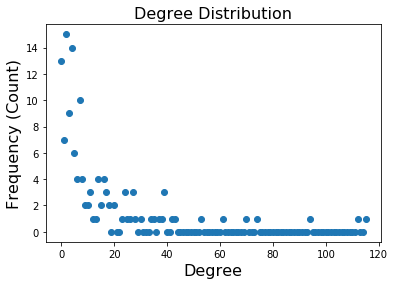

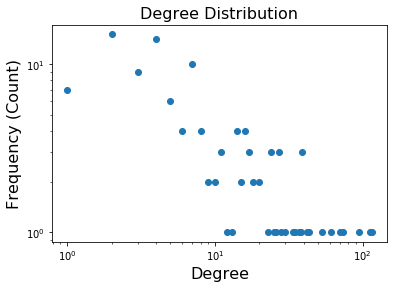

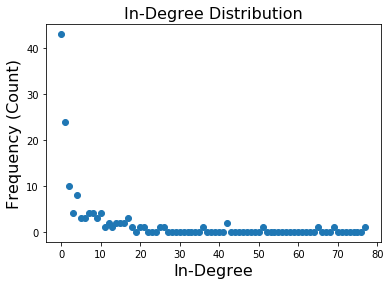

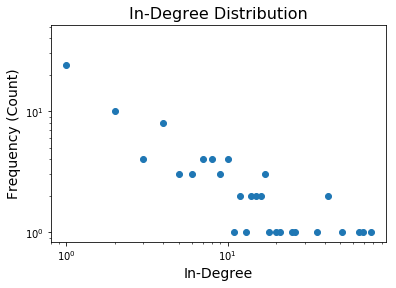

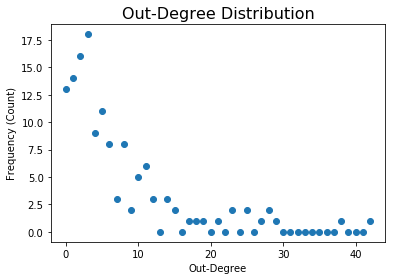

...

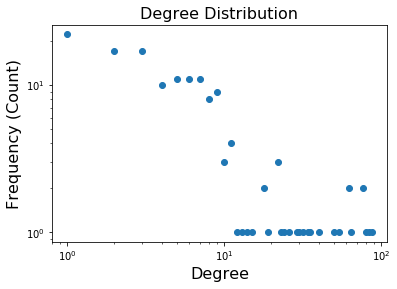

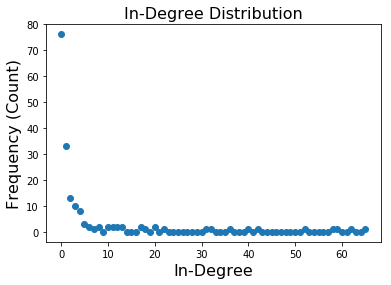

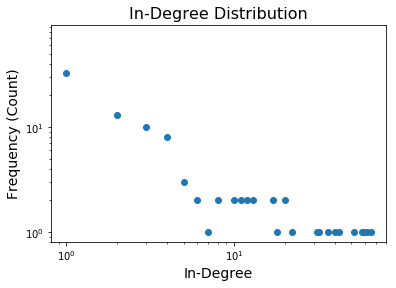

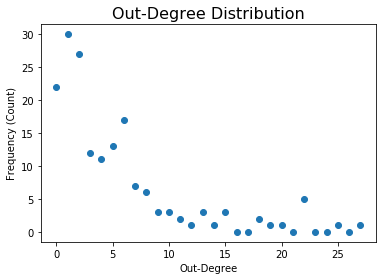

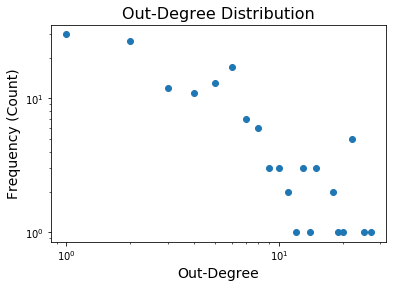

In [69]:
for d in digraphs.keys():
    DG = digraphs[d]["graph"]
    nodes = DG.nodes(data=True)
    nodes_2, degrees = zip(*DG.degree())

    deg_cent = nx.degree_centrality(DG)
    degree_centrality = [deg_cent[n] for n in nodes_2]

    eig_cent = nx.eigenvector_centrality(DG)
    eigenvector_centrality = [eig_cent[n] for n in nodes_2]
    
    bet_cent = nx.betweenness_centrality(DG)
    betweenness_centrality = [bet_cent[n] for n in nodes_2]

    df = pd.DataFrame(data=dict(name=nodes_2, degree=degrees, 
                                degree_centrality=degree_centrality,
                               eigenvector_centrality=eigenvector_centrality,
                               betweenness_centrality=betweenness_centrality))
    
    directory = os.path.join("Data", d.replace(" ", "_").replace(":",""))
    if not os.path.exists(directory):
        os.makedirs(directory)
    
    writer = pd.ExcelWriter(os.path.join(directory, "centrality.xlsx"), engine='xlsxwriter')
    df.to_excel(writer, sheet_name='Sheet1')
    
    from IPython.display import display, HTML

    df = df.sort_values(by="degree", ascending=False)
    print "10 highest degree"
    display(HTML(df[["name", "degree"]][:10].to_html(index=False)))

    df = df.sort_values(by="degree_centrality", ascending=False)
    print "10 highest degree centrality"
    display(HTML(df[["name", "degree_centrality"]][:10].to_html(index=False)))

    df = df.sort_values(by="eigenvector_centrality", ascending=False)
    print "10 highest eigenvector centrality"
    display(HTML(df[["name", "eigenvector_centrality"]][:10].to_html(index=False)))
    
    degree = zip(*DG.degree())[1]
    in_degree = zip(*DG.in_degree())[1]
    out_degree = zip(*DG.out_degree())[1]


    bins = np.arange(min(degree), max(degree)+1)
    hist, bins = np.histogram(degree, bins=bins)

    plt.figure()
    plt.scatter(bins[:-1], hist)
    plt.xlabel("Degree", fontsize=16)
    plt.ylabel("Frequency (Count)", fontsize=16)
    plt.title("Degree Distribution", fontsize=16)


    plt.figure()
    plt.loglog(bins[:-1], hist, 'o')
    plt.xlabel("Degree", fontsize=16)
    plt.ylabel("Frequency (Count)", fontsize=16)
    plt.title("Degree Distribution", fontsize=16)
    plt.savefig(os.path.join(directory, "degree_distribution.png"))


    in_bins = np.arange(min(in_degree), max(in_degree)+1)
    in_hist, in_bins = np.histogram(in_degree, bins=in_bins)

    plt.figure()
    plt.scatter(in_bins[:-1], in_hist)
    plt.xlabel("In-Degree", fontsize=16)
    plt.ylabel("Frequency (Count)", fontsize=16)
    plt.title("In-Degree Distribution", fontsize=16)

    plt.figure()
    plt.loglog(in_bins[:-1], in_hist, 'o')
    plt.xlabel("In-Degree", fontsize=14)
    plt.ylabel("Frequency (Count)", fontsize=14)
    plt.title("In-Degree Distribution", fontsize=16)
    plt.savefig(os.path.join(directory, "in_degree_distribution.png"))


    out_bins = np.arange(min(out_degree), max(out_degree)+1)
    out_hist, out_bins = np.histogram(out_degree, bins=out_bins)

    plt.figure()
    plt.scatter(out_bins[:-1], out_hist)
    plt.xlabel("Out-Degree")
    plt.ylabel("Frequency (Count)")
    plt.title("Out-Degree Distribution", fontsize=16)

    plt.figure()
    plt.loglog(out_bins[:-1], out_hist, 'o')
    plt.xlabel("Out-Degree", fontsize=14)
    plt.ylabel("Frequency (Count)", fontsize=14)
    plt.title("Out-Degree Distribution", fontsize=16)
    plt.savefig(os.path.join(directory, "out_degree_distribution.png"))

    degree_dist_json = {"data": {"In_Degree": {"bins": [float(x) for x in bins[:-1]], "hist": [float(x) for x in hist]},
                                 "Out_Degree": {"bins": [float(x) for x in out_bins[:-1]], "hist": [float(x) for x in out_hist]},
                                 "Degree": {"bins": [float(x) for x in in_bins[:-1]], "hist": [float(x) for x in in_hist]}}}

    with open(os.path.join(directory, "degree_distribution.json"), 'w') as f:
        json.dump(degree_dist_json, f)

# Character sentiment

In [24]:
# ADD SENTIMENT TO THE JSON
dataframes = []
char_sentiment = defaultdict(dict)
chars = list(set(starwars_json["data"]["characters"].keys()).difference(set(starwars_json["failed"]["characters"].keys()).union(exclude_from_nodes)))
for i in range(len(chars)):
    c = chars[i]
    text = starwars_json["data"]["characters"][c]["wikicontent"]
    tokens = []

    # Only detect words and abbreviations, not numbers or punctuations
    pattern = r'''(?x)    # set flag to allow verbose regexps
        (?:[A-Z]\.)+        # abbreviations, e.g. U.S.A.
      | [A-Za-z]\w*(?:-\w+)*  # words with optional internal hyphens
      '''
    stopw = stopwords.words('english')
    other_words = []
    # Tokenize the text with regex
    tokens = nltk.regexp_tokenize(text, pattern)
    # Exclude twitter handles and stopwords from the list of tokens and set the token to lowercase
    tokens = [t.lower() for t in tokens if ((t.lower() not in stopw) and (t.lower() not in other_words))]

    df_tokens = pd.DataFrame(data=dict(word=tokens))
    dataframes.append(df_tokens)
    char_sentiment[c]["tokens"] = df_tokens
    char_sentiment[c]["sentiment"] = evaluate_sentiment(tokens)

tfidf_dataframes = TFIDF(dataframes)
for i in range(len(chars)):
    c = chars[i]
    char_sentiment[c]["TFIDF"] = tfidf_dataframes[i]

In [42]:
DG = digraphs["all"]["graph"]
nodes = DG.nodes(data=True)
nodes_2, degrees = zip(*DG.degree())

deg_cent = nx.degree_centrality(DG)
degree_centrality = [deg_cent[n] for n in nodes_2]

eig_cent = nx.eigenvector_centrality(DG)
eigenvector_centrality = [eig_cent[n] for n in nodes_2]

df = pd.DataFrame(data=dict(name=nodes_2, degree=degrees, 
                            degree_centrality=degree_centrality,
                           eigenvector_centrality=eigenvector_centrality))

df = df.sort_values(by="eigenvector_centrality", ascending=False)
sentiment_list = []
for n in df["name"].values:
    sentiment_list.append(char_sentiment[n]["sentiment"])
df["sentiment"] = sentiment_list

print df[["name", "sentiment"]][:40].sort_values(by="sentiment", ascending=False)

                       name  sentiment
1869            Jan Dodonna   3.622263
1807             Mon Mothma   3.568786
368                Han Solo   3.568666
709          Luke Skywalker   3.451366
612             Leia Organa   3.399977
1093       Lando Calrissian   3.399608
1834            Bail Organa   3.338552
1129              Chewbacca   3.331849
1443         Wilhuff Tarkin   3.323927
1760          Darth Sidious   3.307231
521            Qui-Gon Jinn   3.299560
526   Jabba Desilijic Tiure   3.288800
995           Jar Jar Binks   3.278801
820        Alexsandr Kallus   3.277009
1200      Mitth'raw'nuruodo   3.257984
1353            Saw Gerrera   3.241257
1566          Hera Syndulla   3.210893
28            Padmé Amidala   3.203028
30                    C-3PO   3.190684
752        Anakin Skywalker   3.165466
685             Darth Vader   3.165466
1458           Ezra Bridger   3.153452
1850            Sabine Wren   3.150525
246               Boba Fett   3.149045
669                    Yo

In [65]:
affiliation_sentiment = defaultdict(list)
for n in df.name.values:
    for a in starwars_json["data"]["characters"][n]["affiliations"]:
        affiliation_sentiment[a].append(char_sentiment[n]["sentiment"])

all_affiliations = affiliation_sentiment.keys()
sentiment_list = []
member_number = []
for a in all_affiliations:
    member_number.append(len(affiliation_sentiment[a]))
    sentiment_list.append(np.mean(affiliation_sentiment[a]))
    
df_aff = pd.DataFrame(data=dict(affiliation=all_affiliations, sentiment=sentiment_list, members=member_number))
df_aff = df_aff[df_aff["members"] > 4]
print df_aff.sort_values(by="sentiment", ascending=False)

                                 affiliation  members  sentiment
20                               White Worms       14   3.856994
190        Corellian Engineering Corporation        5   3.825041
56                              Crimson Dawn       17   3.628346
211                        Force Priestesses        5   3.589443
78                           Naberrie family        5   3.571838
145          Figrin D'an and the Modal Nodes        8   3.541271
49                               First Order       48   3.518279
28          Alliance to Restore the Republic      219   3.491772
131                             Canto Casino        7   3.482502
14                         Bright Tree tribe       18   3.471881
108                             New Republic       35   3.442658
24                InterGalactic Banking Clan        5   3.433022
185                               Resistance       92   3.418026
40                           House of Organa       10   3.417626
199                      